<a href="https://colab.research.google.com/github/amazing-adrian/neural_style_transfer/blob/main/neural_style_transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!mkdir 'content_images'
!mkdir 'styles'

import os

import IPython.display as display
import tensorflow_hub as hub
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

import PIL.Image

model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')

In [ ]:
def load_img(path_to_img):
  img = tf.io.read_file(path_to_img)
  img = tf.io.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)
  img = img[tf.newaxis, :]

  return img

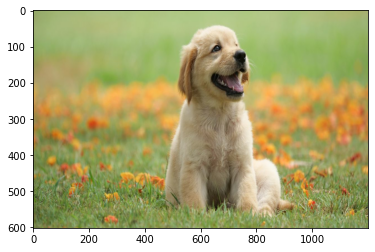

In [ ]:
# You can view the image here

plt.imshow(content_image[0], aspect='auto')
plt.show()

In [ ]:
content_image = load_img('content_images/dog.jpg')
#content_image = tf.image.resize(content_image, (1020, 1220))

styles = ['/content/styles/' +  i for i in os.listdir('styles') if not i.startswith('.')]

final_images = []

sizes = [(i, i) for i in range(128, 321, 64)]       
print(sizes)

style_image = load_img(styles[0])
#style_image = load_img('styles/geo.png')
#style_image = tf.image.resize(style_image, (256, 256))

output = model(tf.constant(content_image), tf.constant(style_image))[0]

for style in styles:
  style_image = load_img(style)
  for size in sizes:
    style_image = tf.image.resize(style_image, size)
    outputs = model(tf.constant(content_image), tf.constant(style_image))[0]
    final_images.append(outputs[0])
len(final_images) 

[(128, 128), (192, 192), (256, 256), (320, 320)]


12

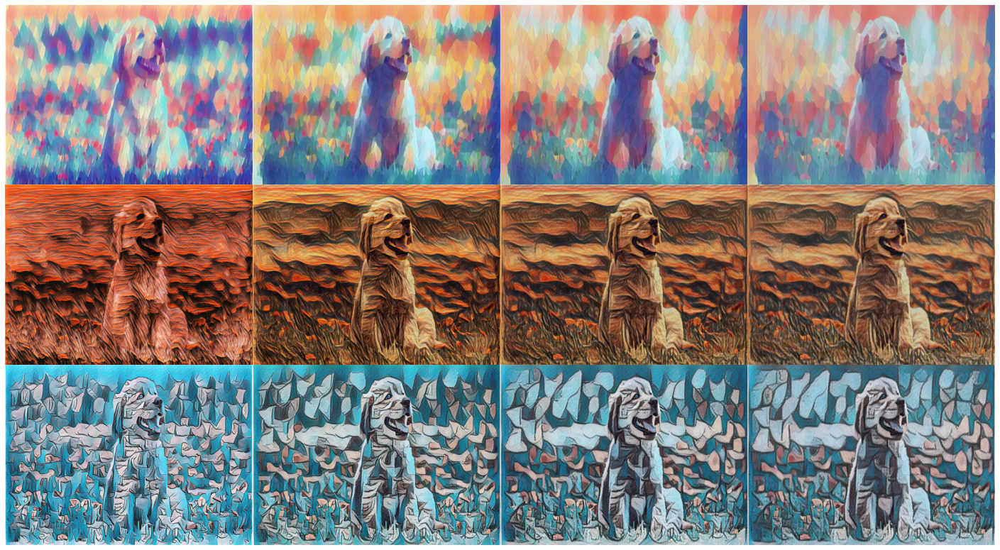

In [ ]:
w=10
h=10
fig=plt.figure(figsize=(25, 14))
columns = len(sizes)
rows = len(styles)
for i in range(1, len(final_images) + 1):
    img = final_images[i - 1]
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    plt.imshow(img, aspect='auto')
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

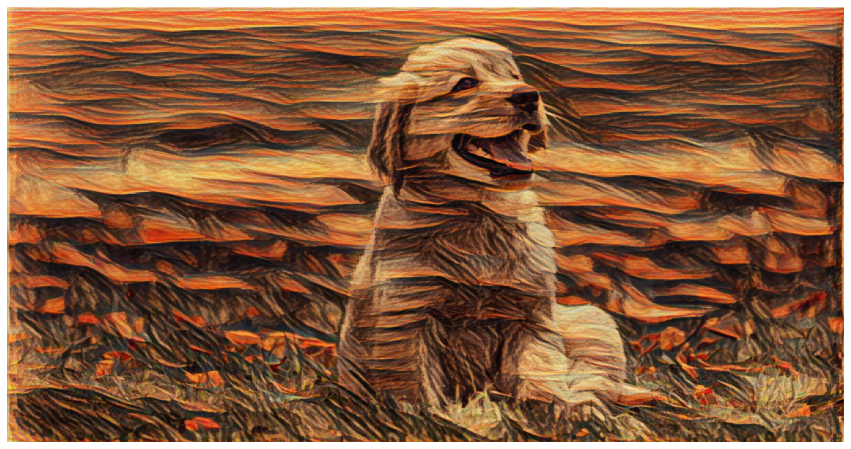

In [ ]:
plt.figure(figsize=(15, 8))
plt.axis('off')
plt.imshow(final_images[1], aspect='auto')



# Custom style transfer


In [ ]:
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224))
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
prediction_probabilities = vgg(x)
prediction_probabilities.shape


574717952/574710816 [==============================] - 4s 0us/step


TensorShape([1, 1000])

In [ ]:
predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(prediction_probabilities.numpy())[0]
[(class_name, prob) for (number, class_name, prob) in predicted_top_5]

40960/35363 [==================================] - 0s 0us/step


[('standard_poodle', 0.6814123),
 ('Afghan_hound', 0.07551539),
 ('Bedlington_terrier', 0.04502784),
 ('gibbon', 0.03755789),
 ('miniature_poodle', 0.025198203)]

In [ ]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

print()
for layer in vgg.layers:
  print(layer.name)

80142336/80134624 [==============================] - 1s 0us/step

input_2
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [ ]:
content_layers = ['block5_conv1'] 

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',            
                'block5_conv1'
            ]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [ ]:
def vgg_layers(layer_names):
  """ Creates a vgg model that returns a list of intermediate output values."""
  # Load our model. Load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

# !!
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

#Look at the statistics of each layer's output
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()

# !!
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

block1_conv1
  shape:  (1, 320, 320, 64)
  min:  0.0
  max:  744.95544
  mean:  31.194216

block2_conv1
  shape:  (1, 160, 160, 128)
  min:  0.0
  max:  3659.7083
  mean:  138.40602

block3_conv1
  shape:  (1, 80, 80, 256)
  min:  0.0
  max:  8850.166
  mean:  110.72765

block4_conv1
  shape:  (1, 40, 40, 512)
  min:  0.0
  max:  12499.695
  mean:  424.06693

block5_conv1
  shape:  (1, 20, 20, 512)
  min:  0.0
  max:  1493.6348
  mean:  30.664402



In [ ]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg =  vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers], 
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name:value 
                    for content_name, value 
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name:value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content':content_dict, 'style':style_dict}

In [ ]:
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

print('Styles:')
for name, output in sorted(results['style'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print("Contents:")
for name, output in sorted(results['content'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())

Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.001275525
    max:  17024.305
    mean:  204.45993

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  30594.78
    mean:  4462.9116

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.8442258
    max:  174133.52
    mean:  3852.3198

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  1959011.5
    mean:  60642.23

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  47015.99
    mean:  378.53326

Contents:
   block5_conv1
    shape:  (1, 63, 76, 512)
    min:  0.0
    max:  2767.001
    mean:  17.11895


In [ ]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

image = tf.Variable(content_image)

def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [ ]:
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

style_weight=1e-1
content_weight=1e6

def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss


# !!
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

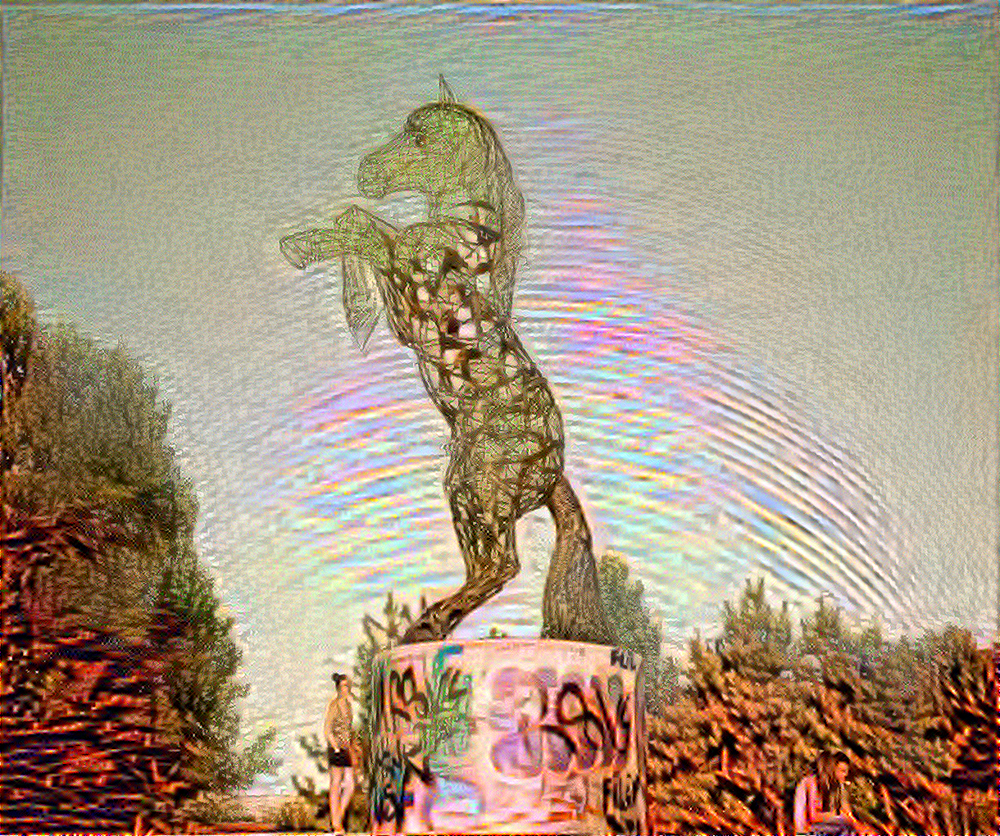

Train step: 150
.............

KeyboardInterrupt: ignored

In [ ]:
import time
start = time.time()

epochs = 5
steps_per_epoch = 50

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

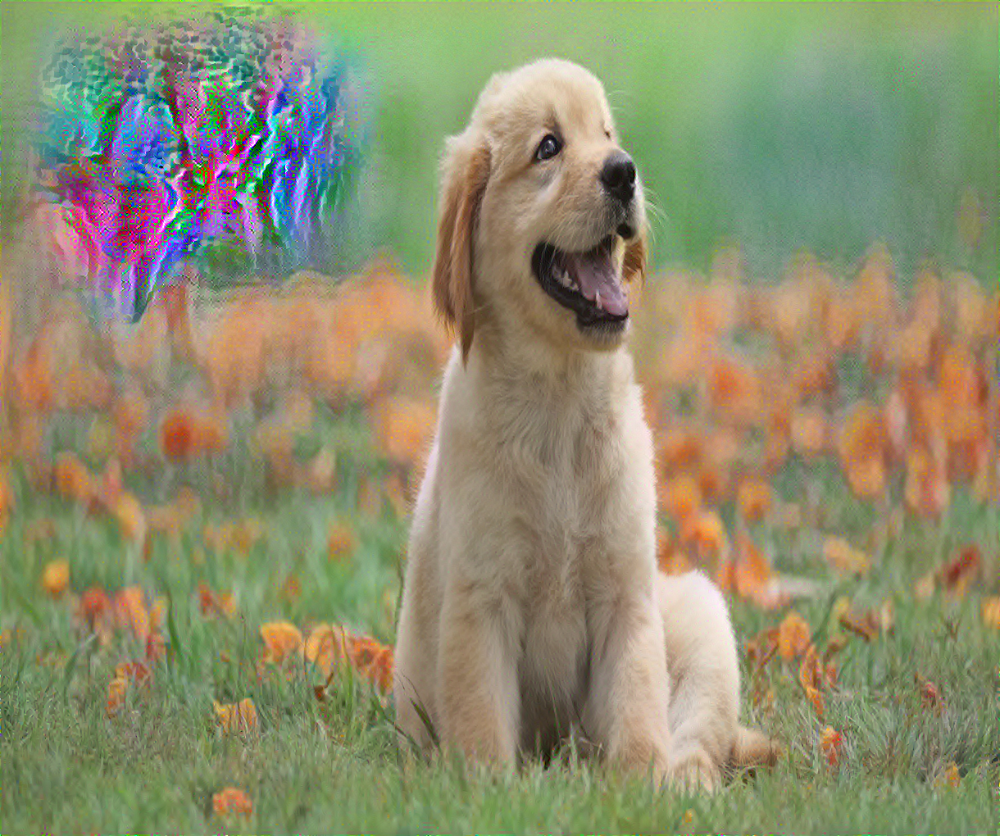

Train step: 1500
Total time: 627.1


In [ ]:
def high_pass_x_y(image):
  x_var = image[:,:,1:,:] - image[:,:,:-1,:]
  y_var = image[:,1:,:,:] - image[:,:-1,:,:]

  return x_var, y_var

def total_variation_loss(image):
  x_deltas, y_deltas = high_pass_x_y(image)
  return tf.reduce_sum(tf.abs(x_deltas)) + tf.reduce_sum(tf.abs(y_deltas))

total_variation_weight=30

@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)
    loss += total_variation_weight*tf.image.total_variation(image)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))


image = tf.Variable(content_image)

import time
start = time.time()

epochs = 15
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

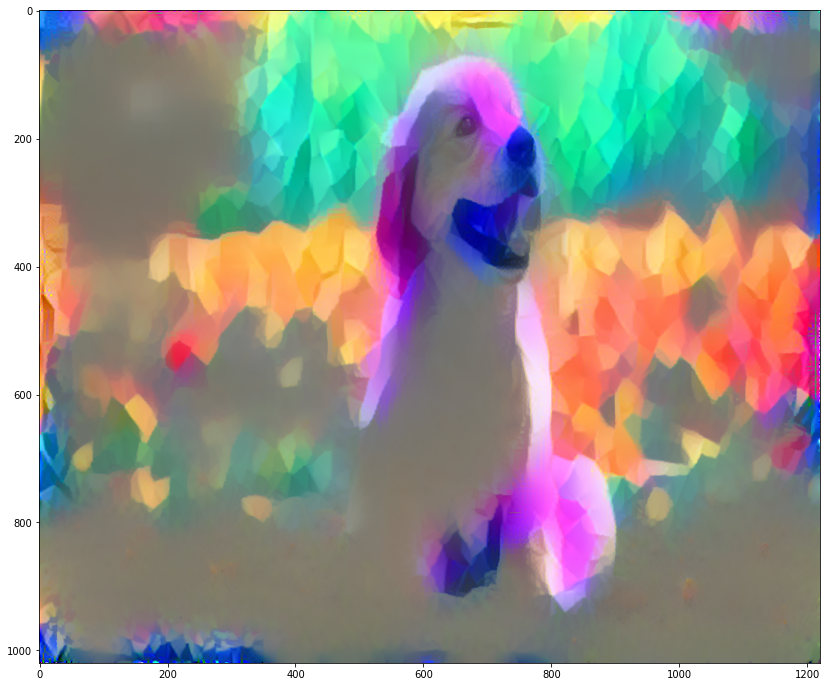

In [ ]:
plt.figure(figsize=[15, 12])
plt.imshow(image[0])